In [1]:
import numpy as np
import pandas as pd
import joblib 
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading the data
attrition_df = pd.read_csv("employee-attrition.csv")

In [3]:
# Data type
print(type(attrition_df))

<class 'pandas.core.frame.DataFrame'>


In [4]:
attrition_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   age                         1470 non-null   int64 
 1   business_travel             1470 non-null   object
 2   daily_rate                  1470 non-null   int64 
 3   department                  1470 non-null   object
 4   distance_from_home          1470 non-null   int64 
 5   education                   1470 non-null   int64 
 6   education_field             1470 non-null   object
 7   employee_count              1470 non-null   int64 
 8   employee_number             1470 non-null   int64 
 9   environment_satisfaction    1470 non-null   int64 
 10  gender                      1470 non-null   object
 11  hourly_rate                 1470 non-null   int64 
 12  job_involvement             1470 non-null   int64 
 13  job_level                   1470 non-null   int6

In [5]:
# shape will return as tuple containing the number of rows and columns
print(attrition_df.shape)
print(attrition_df.shape[0])
print(attrition_df.shape[1])

(1470, 35)
1470
35


In [6]:
# By default, head() will display 5 rows
attrition_df.head()

,age,business_travel,daily_rate,department,distance_from_home,education,education_field,employee_count,employee_number,environment_satisfaction,...,standard_hours,stock_option_level,total_working_years,training_times_last_year,work_life_balance,years_at_company,years_in_current_role,years_since_last_promotion,years_with_curr_manager,attrition
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,...,80,0,8,0,1,6,4,0,5,1
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,...,80,1,10,3,3,10,7,1,7,0
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,...,80,0,7,3,3,0,0,0,0,1
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,...,80,0,8,3,3,8,7,3,0,0
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,...,80,1,6,3,3,2,2,2,2,0


In [7]:
# Print the number of rows and columns (as done before)
# The format is f""
print(f"Rows     : {attrition_df.shape[0]}")
print(f"Columns  : {attrition_df.shape[1]}" ,)
print()

# Print the column names
print(f"Features : {attrition_df.columns.tolist()}")
print()

# Print the total number of null values in the data
# Null values are - NaN (not a number), or blank spaces
print(f"Missing values :  {attrition_df.isnull().sum().values.sum()}")

# For each column, print the number of unique values
print(f"Unique values :  {attrition_df.nunique()}")

Rows     : 1470
Columns  : 35

Features : ['age', 'business_travel', 'daily_rate', 'department', 'distance_from_home', 'education', 'education_field', 'employee_count', 'employee_number', 'environment_satisfaction', 'gender', 'hourly_rate', 'job_involvement', 'job_level', 'job_role', 'job_satisfaction', 'marital_status', 'monthly_income', 'monthly_rate', 'num_companies_worked', 'over_18_yrs', 'overtime', 'percent_salary_hike', 'performance_rating', 'relationship_satisfaction', 'standard_hours', 'stock_option_level', 'total_working_years', 'training_times_last_year', 'work_life_balance', 'years_at_company', 'years_in_current_role', 'years_since_last_promotion', 'years_with_curr_manager', 'attrition']

Missing values :  0
Unique values :  age                             43
business_travel                  3
daily_rate                     886
department                       3
distance_from_home              29
education                        5
education_field                  6
employee

In [8]:
attrition_df.describe()

,age,daily_rate,distance_from_home,education,employee_count,employee_number,environment_satisfaction,hourly_rate,job_involvement,job_level,...,standard_hours,stock_option_level,total_working_years,training_times_last_year,work_life_balance,years_at_company,years_in_current_role,years_since_last_promotion,years_with_curr_manager,attrition
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129,0.161224
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136,0.367863
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,0.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,0.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000,0.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,1.000000


In [9]:
# corr() function to compute the correlations and display as text
corr = attrition_df.select_dtypes(include=['number']).corr()
print(type(corr))
print(corr)

<class 'pandas.core.frame.DataFrame'>
                                 age  daily_rate  distance_from_home  \
age                         1.000000    0.010661           -0.001686   
daily_rate                  0.010661    1.000000           -0.004985   
distance_from_home         -0.001686   -0.004985            1.000000   
education                   0.208034   -0.016806            0.021042   
employee_count                   NaN         NaN                 NaN   
employee_number            -0.010145   -0.050990            0.032916   
environment_satisfaction    0.010146    0.018355           -0.016075   
hourly_rate                 0.024287    0.023381            0.031131   
job_involvement             0.029820    0.046135            0.008783   
job_level                   0.509604    0.002966            0.005303   
job_satisfaction           -0.004892    0.030571           -0.003669   
monthly_income              0.497855    0.007707           -0.017014   
monthly_rate              

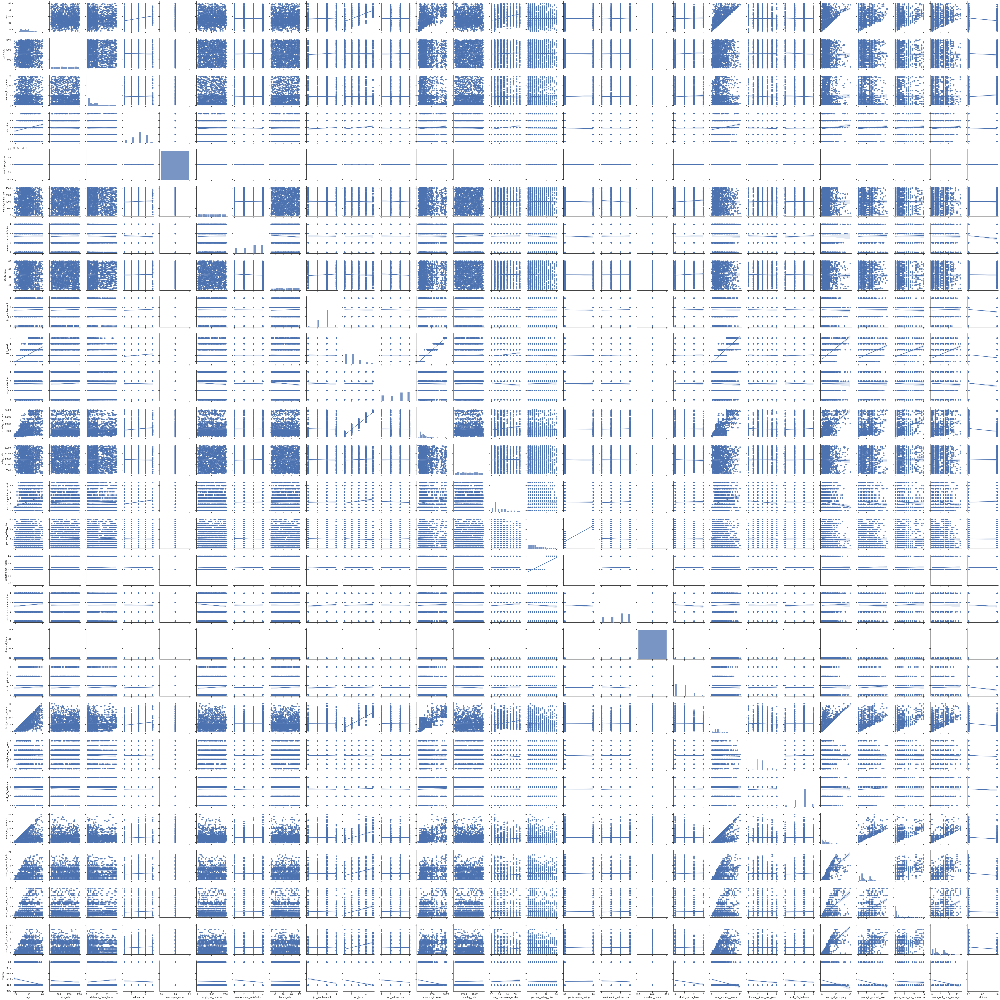

In [10]:
# 2. Using seaborn's pairplot() to plot the correlations as scatter plots and regression lines
sns.set(style='ticks')
#plt.figure(figsize=(8,16)) #figsize(width, height) in inches - default(6.4, 4.8)
sns.pairplot(attrition_df, kind="reg")


plt.tight_layout() 


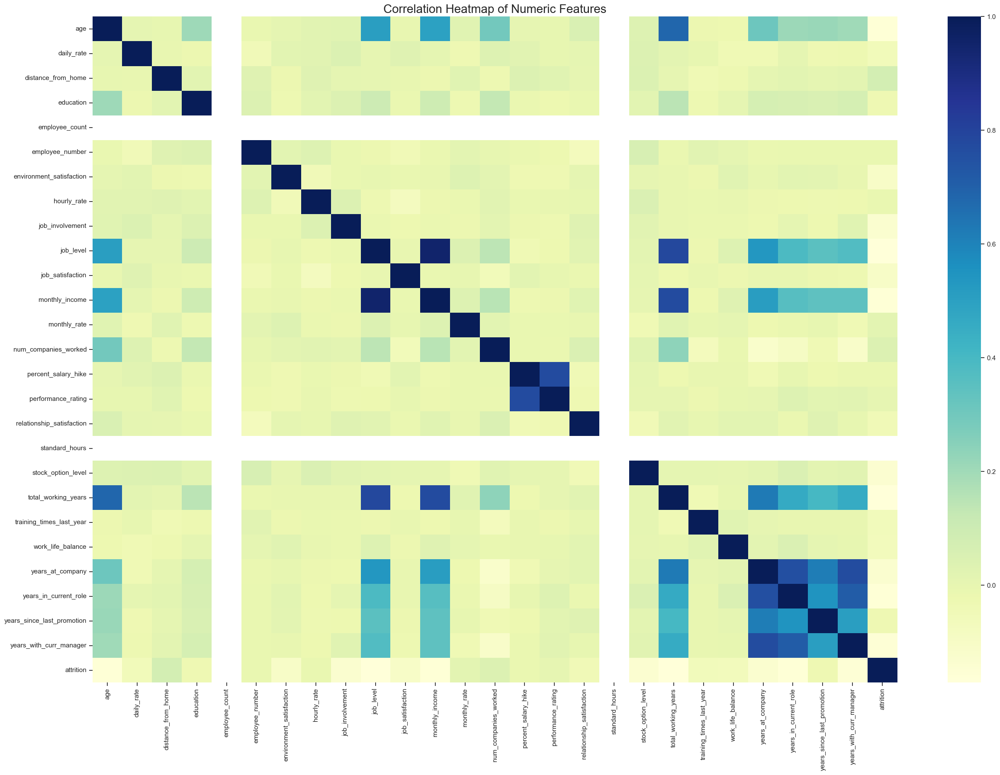

In [13]:
# 3.Using seaborn to plot the correlations as a heatmap
# Dark shades represents positive correlation while lighter shades represents negative correlation
numeric_df = attrition_df.select_dtypes(include=['number'])

# Plot the heatmap
plt.figure(figsize=(30, 20))
sns.heatmap(numeric_df.corr(), cmap='YlGnBu', annot=False)
plt.title("Correlation Heatmap of Numeric Features", fontsize=20)
plt.show()

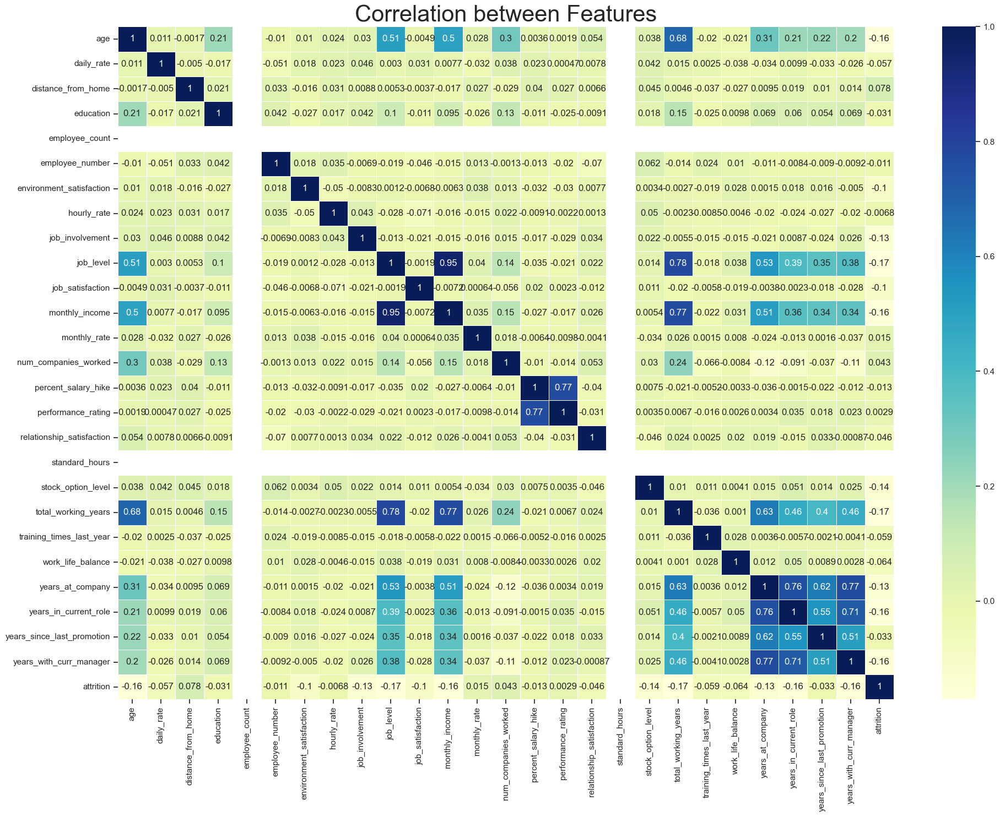

In [15]:
# 4. Using seaborn to plot the correlations as a heatmap
numeric_df = attrition_df.select_dtypes(include=['number'])

plt.rcParams['figure.figsize'] = (20, 15)

# Plot heatmap
sns.heatmap(numeric_df.corr(), annot=True, linewidths=0.5, cmap="YlGnBu")


plt.title('Correlation between Features', fontsize=30)
plt.tight_layout()

plt.show()

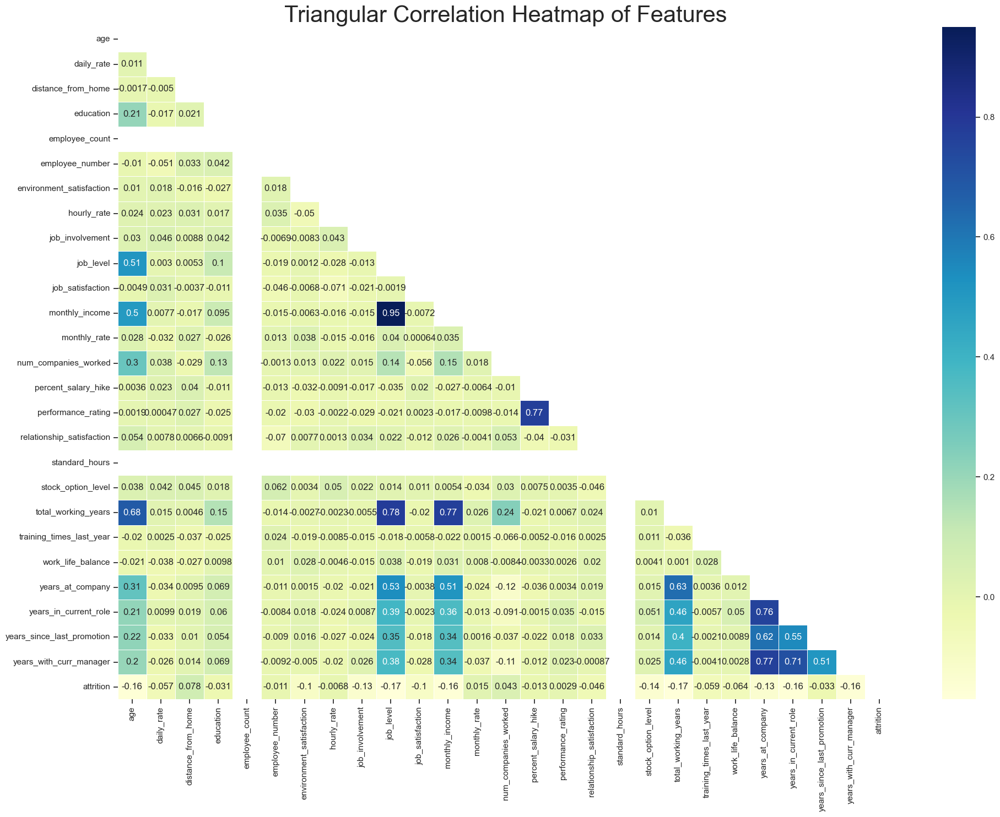

In [17]:
# Changing the shape of the matrix from rectangular to triangular
numeric_df = attrition_df.select_dtypes(include=['number'])

# Compute correlation matrix
corr = numeric_df.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))


plt.figure(figsize=(20, 15))
sns.heatmap(corr, annot=True, mask=mask, cmap="YlGnBu", linewidths=0.5)
plt.title('Triangular Correlation Heatmap of Features', fontsize=30)
plt.tight_layout()

plt.show()

labels: ['Retainment', 'Attrition']
values: [1233, 237]


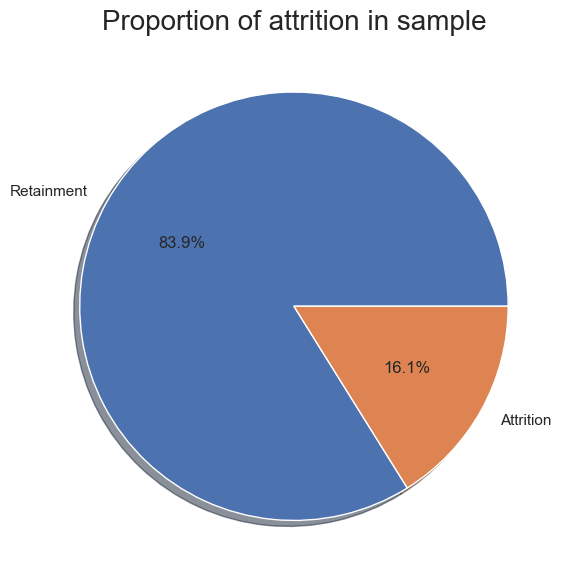

In [18]:
# Plot a pie chart
labels = ["Retainment", "Attrition"]
print(f"labels: {labels}")

# Get the values from the "attrition" column - using values to get the values
values = attrition_df["attrition"].value_counts().values.tolist()
print(f"values: {values}")

# Use matplotlib to draw a simple pie chart
plt.figure(figsize=(6,6)) #figsize(width, height) in inches - default(6.4, 4.8)
plt.pie(values, labels=labels, autopct='%1.1f%%', shadow=True)
plt.title("Proportion of attrition in sample", fontsize=20)


plt.tight_layout() # automatically adjusts subplot to fit in the figure area


In [19]:
# retained
retained_df = attrition_df[attrition_df["attrition"]==0]
retained_df.head()

,age,business_travel,daily_rate,department,distance_from_home,education,education_field,employee_count,employee_number,environment_satisfaction,...,standard_hours,stock_option_level,total_working_years,training_times_last_year,work_life_balance,years_at_company,years_in_current_role,years_since_last_promotion,years_with_curr_manager,attrition
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,...,80,1,10,3,3,10,7,1,7,0
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,...,80,0,8,3,3,8,7,3,0,0
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,...,80,1,6,3,3,2,2,2,2,0
5,32,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,...,80,0,8,2,2,7,7,3,6,0
6,59,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,...,80,3,12,3,2,1,0,0,0,0


In [20]:
# attrited
attrited_df = attrition_df[attrition_df["attrition"]==1]
attrited_df.head()

,age,business_travel,daily_rate,department,distance_from_home,education,education_field,employee_count,employee_number,environment_satisfaction,...,standard_hours,stock_option_level,total_working_years,training_times_last_year,work_life_balance,years_at_company,years_in_current_role,years_since_last_promotion,years_with_curr_manager,attrition
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,...,80,0,8,0,1,6,4,0,5,1
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,...,80,0,7,3,3,0,0,0,0,1
14,28,Travel_Rarely,103,Research & Development,24,3,Life Sciences,1,19,3,...,80,0,6,4,3,4,2,0,3,1
21,36,Travel_Rarely,1218,Sales,9,4,Life Sciences,1,27,3,...,80,0,10,4,3,5,3,0,3,1
24,34,Travel_Rarely,699,Research & Development,6,1,Medical,1,31,2,...,80,0,8,2,3,4,2,1,3,1


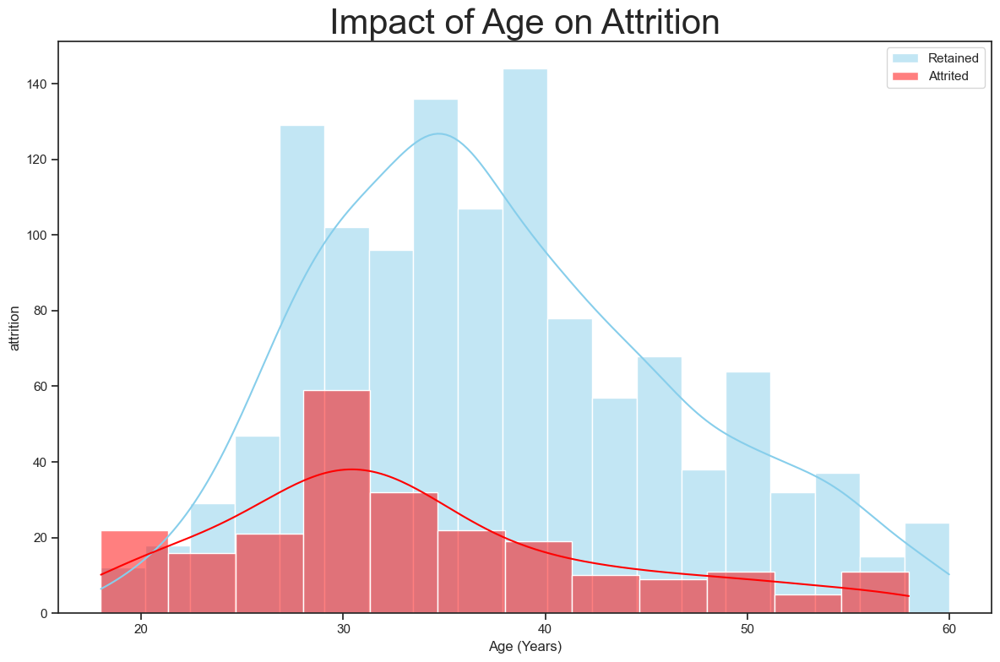

In [21]:
# Plot frequency distributions of non-diabetics and diabetics
# Ref:https://seaborn.pydata.org/generated/seaborn.distplot.html

plt.figure(figsize=(12,8))

sns.histplot(data=retained_df, x="age", color="skyblue", label="Retained", kde=True)
sns.histplot(data=attrited_df, x="age", color="red", label="Attrited", kde=True)

plt.legend()
plt.title('Impact of Age on Attrition', fontsize = 30)
plt.xlabel("Age (Years)")
plt.ylabel("attrition")


plt.tight_layout() # automatically adjusts subplot to fit in the figure area


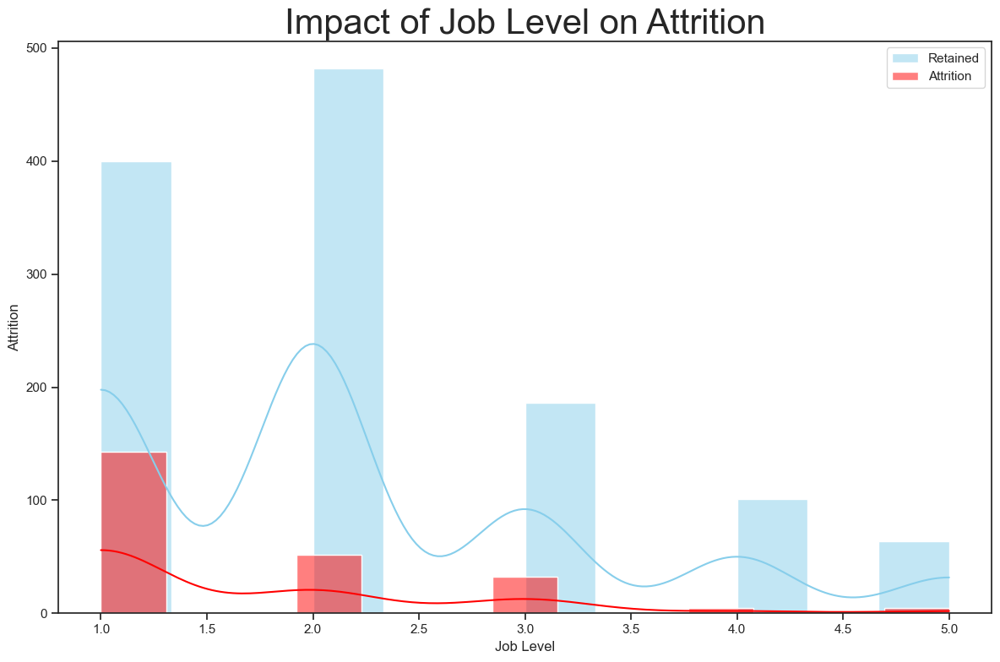

In [22]:
# Plot frequency distributions of retained_df and attrited_df
plt.figure(figsize=(12,8))


sns.histplot(data=retained_df, x="job_level", color="skyblue", label="Retained", kde=True)
sns.histplot(data=attrited_df, x="job_level", color="red", label="Attrition", kde=True)

plt.title('Impact of Job Level on Attrition', fontsize = 30)
plt.xlabel("Job Level")
plt.ylabel("Attrition")
plt.legend()


plt.tight_layout() 


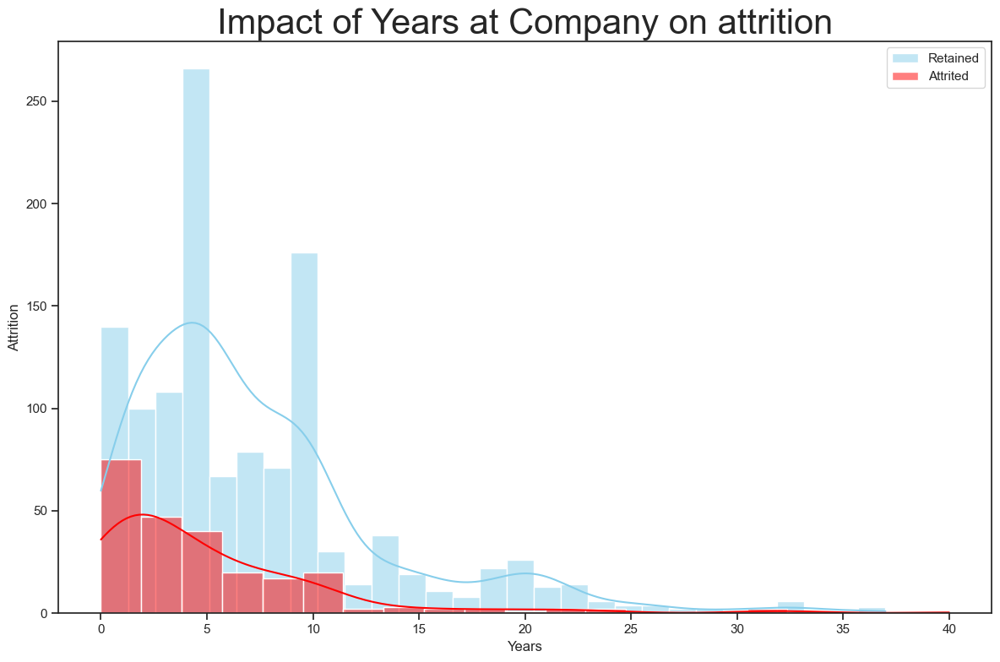

In [23]:
# Plot frequency distributions of retained_df and attrited_df
plt.figure(figsize=(12,8))

sns.histplot(data=retained_df, x="years_at_company", color="skyblue", label="Retained", kde=True)
sns.histplot(data=attrited_df, x="years_at_company", color="red", label="Attrited", kde=True)

plt.legend()
plt.title('Impact of Years at Company on attrition', fontsize = 30)
plt.xlabel("Years")
plt.ylabel("Attrition")


plt.tight_layout()
 

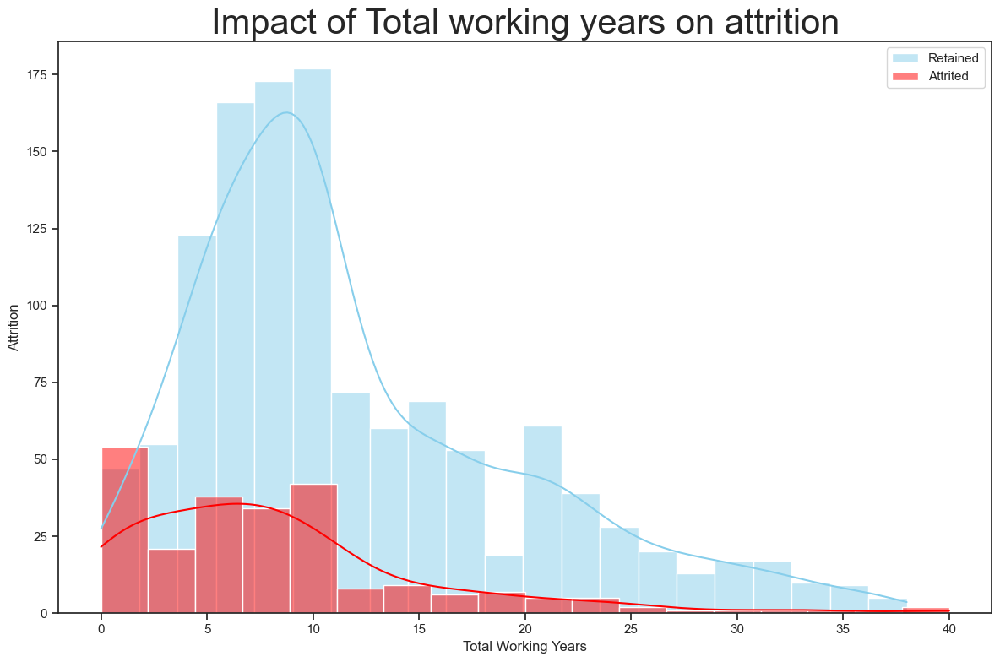

In [24]:
# Plot frequency distributions of retained_df and attrited_df

plt.figure(figsize=(12,8))

sns.histplot(data=retained_df, x="total_working_years", color="skyblue", label="Retained", kde=True)
sns.histplot(data=attrited_df, x="total_working_years", color="red", label="Attrited", kde=True)

plt.legend()
plt.title('Impact of Total working years on attrition', fontsize = 30)
plt.xlabel("Total Working Years")
plt.ylabel("Attrition")

plt.tight_layout()
 

In [25]:
def income(df): 
    if df["monthly_income"] <= 3500:
        return "0"
    elif df["monthly_income"] > 3500:
        return "1"

# Use apply() to apply a lambda function for all the rows of the dataframe
# The lambda function calls the previously defined function monthly_income()
# To which it passes the attrition_df as parameter
# And a category is returned and saved in a new column named "monthly_income_category"
attrition_df["monthly_income_category"] = \
    attrition_df.apply(lambda attrition_df:income(attrition_df), axis = 1) # axis=1 = row-wise
# Check
attrition_df.head()
# This works as there's a new column named "monthly_income_category"
# The column "monthly_income" is no longer needed and hence can be deleted 

# This example has shown how to add a column using apply() and a lambda function

,age,business_travel,daily_rate,department,distance_from_home,education,education_field,employee_count,employee_number,environment_satisfaction,...,stock_option_level,total_working_years,training_times_last_year,work_life_balance,years_at_company,years_in_current_role,years_since_last_promotion,years_with_curr_manager,attrition,monthly_income_category
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,...,0,8,0,1,6,4,0,5,1,1
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,...,1,10,3,3,10,7,1,7,0,1
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,...,0,7,3,3,0,0,0,0,1,0
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,...,0,8,3,3,8,7,3,0,0,0
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,...,1,6,3,3,2,2,2,2,0,0


In [26]:
# Separate the clean data into retained and attrited
retained_df = attrition_df[attrition_df["attrition"]==0]
attrited_df = attrition_df[attrition_df["attrition"]==1] 

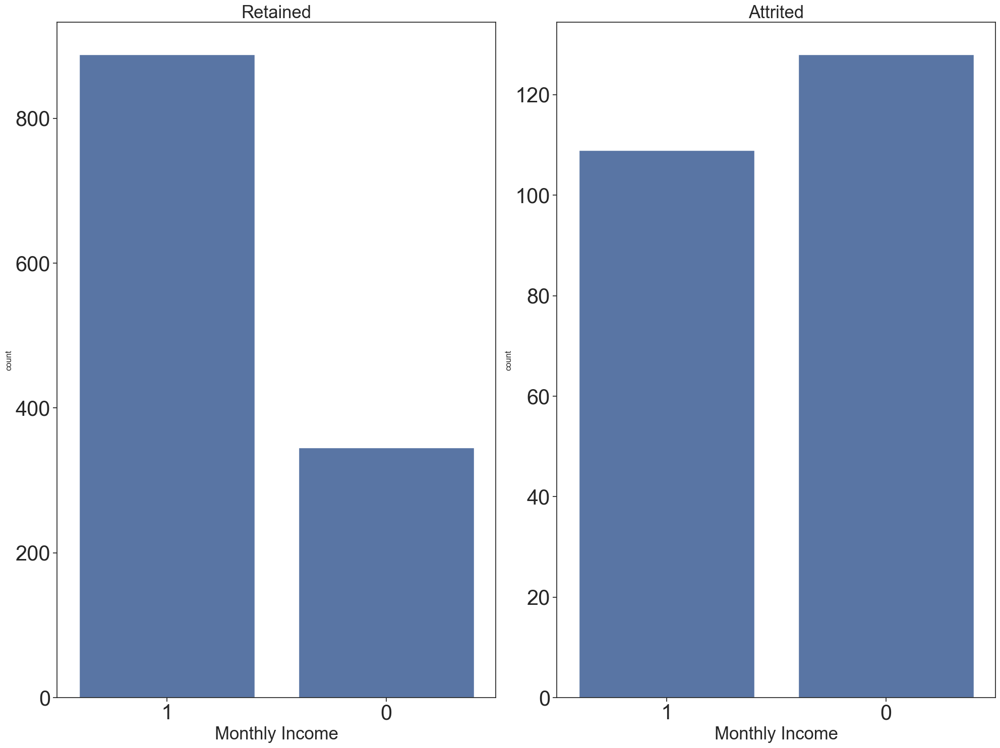

In [27]:
# Plot the charts using Seaborn's countplot()

# AS 2 separate plots side by side
fig, ax = plt.subplots(1,2)
ax1 = sns.countplot(x="monthly_income_category", data=retained_df, ax=ax[0]) # Retained dataset
ax2 = sns.countplot(x="monthly_income_category", data=attrited_df, ax=ax[1]) # Attrited dataset

ax1.set_title("Retained", fontsize=25)
ax1.set_xlabel("Monthly Income", fontsize=25)
ax2.set_title("Attrited", fontsize=25)
ax2.set_xlabel("Monthly Income", fontsize=25)
ax1.tick_params(axis='both', which='both', labelsize=30) # x/y axes, minor/major ticks for ax1
ax2.tick_params(axis='both', which='both', labelsize=30) # x/y axes, minor/major ticks for ax2



plt.tight_layout() # automatically adjusts subplot to fit in the figure area


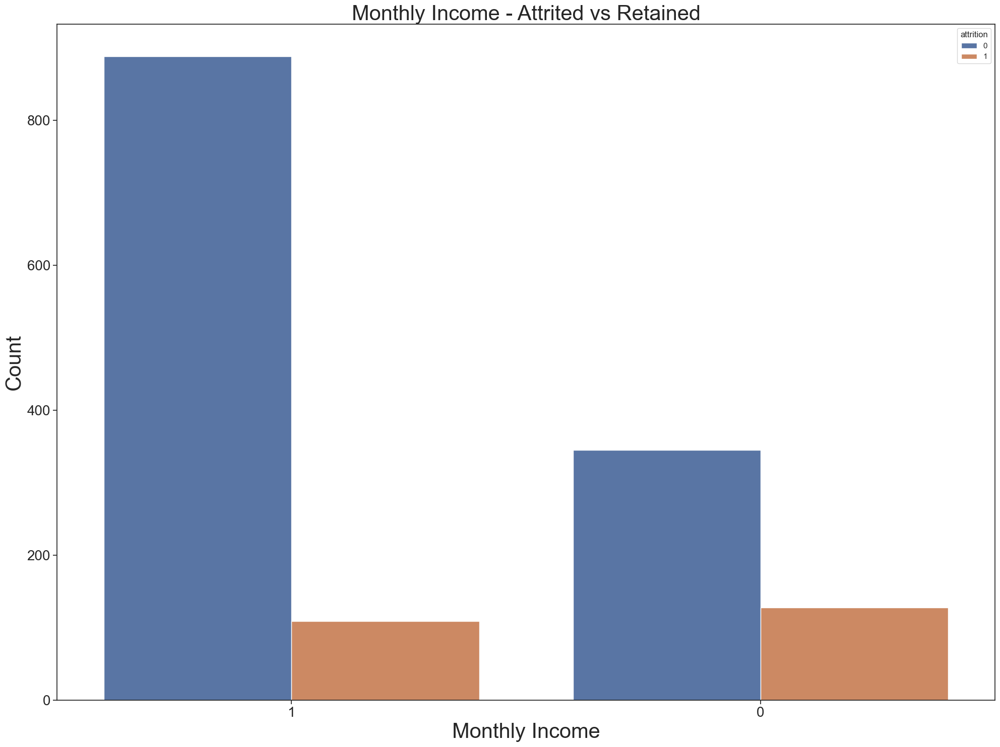

In [28]:
# Plot the charts using Seaborn's countplot()

# As a single plot with wo count charts
sns.countplot(x='monthly_income_category', 
              data=attrition_df, # Whole dataset (retained + attrited)
              hue='attrition') # grouped by outcome

plt.title('Monthly Income - Attrited vs Retained', fontsize=30)
plt.xlabel("Monthly Income", fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.tick_params(axis='both', which='both', labelsize=20) # x/y axes, minor/major ticks for plt


plt.tight_layout()
 

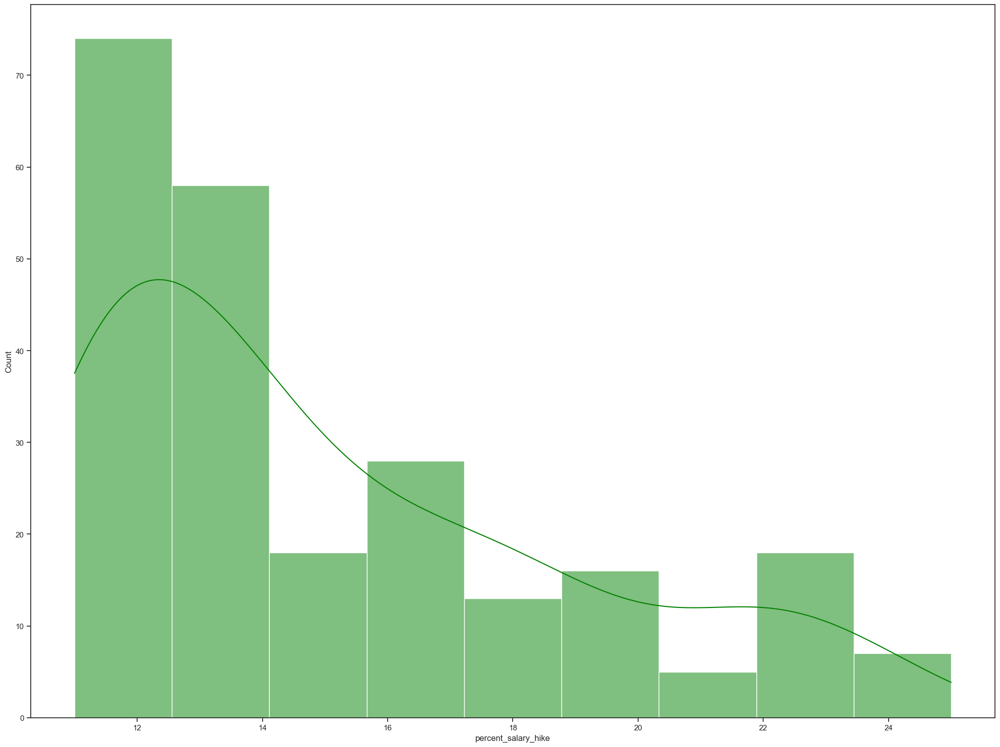

In [29]:
# Plotting the distribution of a continuous variable (percent_salary_hike) as a histogram.

sns.histplot(data=attrited_df, x="percent_salary_hike", color="green", kde=True)


plt.tight_layout()
